# Stable Diffusion with 🤗 Diffusers

**Pedro Cuenca, Patrick von Platen, Suraj Patil, Jeremy Howard**

Chances are you'll have seen examples in Twitter (and elsewhere) of images generated by typing a short description of the scene you want to create. This is the culmination of years of work in generative models. This notebook introduces Stable Diffusion, the highest-quality open source text to image model as of now. It's also small enough to run in consumer GPUs rather than in a datacenter. We use the 🤗 Hugging Face [🧨 Diffusers library](https://github.com/huggingface/diffusers), which is currently our recommended library for using diffusion models.

As we'll see during the course, understanding state-of-the-art generative models requires a deep understanding of many of the fundamental blocks in modern machine learning models. This notebook shows what Stable Diffusion can do and a glimpse of its main components.

_If you open this notebook in Colab, please uncomment and run the following cell. If you get type errors when generating your first image, please try to upgrade your transformers installation using `pip install --upgrade transformers`_

## Using Stable Diffusion

To run Stable Diffusion on your computer you have to accept the model license. It's an open CreativeML OpenRail-M license that **claims no rights on the outputs you generate and prohibits you from deliberately producing illegal or harmful content.** The [model card](https://huggingface.co/CompVis/stable-diffusion-v1-4) provides more details. If you do accept the license, you need to be a registered user in 🤗 Hugging Face Hub and use an access token for the code to work.<br>
You have two options to provide your access token:

* Use the `huggingface-cli login` command-line tool in your terminal and paste your token when prompted. It will be saved in a file in your computer.
* Or use `notebook_login()` in a notebook, which does the same thing.

In [1]:
pip list | grep -e fastcore -e diffusers -e transformers -e huggingface-hub -e fastai -e fastdownload # -e torch

diffusers                         0.6.0
fastai                            2.7.9
fastcore                          1.5.27
fastdownload                      0.0.7
huggingface-hub                   0.10.1
transformers                      4.23.1
Note: you may need to restart the kernel to use updated packages.


In [2]:
import logging
from pathlib import Path
logging.disable(logging.WARNING)

In [3]:
from huggingface_hub import notebook_login
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

[`StableDiffusionPipeline`](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion#diffusers.StableDiffusionPipeline) is an end-to-end [diffusion inference pipeline](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion) that allows you to start generating images with just a few lines of code. Many Hugging Face libraries (along with other libraries such as scikit-learn) use the concept of a "pipeline" to indicate a sequence of steps that when combined complete some task.<br>
We'll look at the individual steps of the pipeline later -- for now though, let's just use it to see what it can do.

By "inference" we refer to using an existing model to generate samples (e.g., images), as opposed to "training" (or fine-tuning) models using new data.

We use [`from_pretrained`](https://huggingface.co/docs/diffusers/main/en/api/diffusion_pipeline#diffusers.DiffusionPipeline.from_pretrained) to create the pipeline and download the pretrained weights. We indicate that we want to use the `fp16` (half-precision) version of the weights, and we tell `diffusers` to expect the weights in that format. <br>
This allows us to perform much faster inference with almost no discernible difference in quality. The string passed to `from_pretrained` in this case (`CompVis/stable-diffusion-v1-4`) is the repo id of a pretrained pipeline hosted on [Hugging Face Hub](https://huggingface.co/models); it can also be a path to a directory containing pipeline weights. The weights for all the models in the pipeline will be downloaded and cached the first time you run this cell.

In [4]:
import torch
torch.manual_seed(1)
from diffusers import StableDiffusionPipeline,  StableDiffusionImg2ImgPipeline

In [5]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16,safety_checker=None).to("cuda")
pipe.enable_attention_slicing()

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

The weights are cached in your home directory by default.

In [6]:
ls ~/.cache/huggingface/diffusers/

models--CompVis--stable-diffusion-v1-4/  models--google--ddpm-church-256/
models--google--ddpm-celebahq-256/       models--pcuenq--jh_dreambooth_1000/


We are now ready to use the pipeline to start creating images, and pass it a prompt, just some text.

In [7]:
prompt = "a photograph of an astronaut riding a horse"
#prompt = "a blonde bikini clad female riding a horse"
#prompt = "foto de mujer hermosa desnuda montada en un caballo"

## Initial pipes

  0%|          | 0/51 [00:00<?, ?it/s]

CPU times: user 7.55 s, sys: 1.75 s, total: 9.3 s
Wall time: 10.6 s


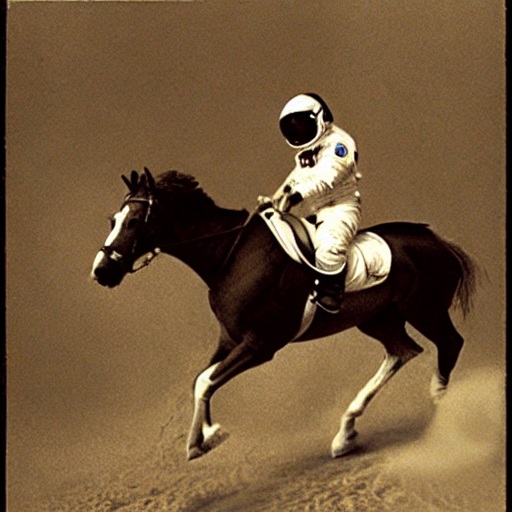

In [8]:
%time pipe(prompt).images[0]

Every time we call a pipeline using the same random seed we get the same image.  
Hence we can send others the random seed manually, and the prompt, and say: 
“oh!,  this is a really cool astronaut riding a horse"

That's the most basic way to start creating images.
It took 51 steps. 
This is different to what we're used to with inference in fastai, e.g., it's one step to classify something. 

  0%|          | 0/51 [00:00<?, ?it/s]

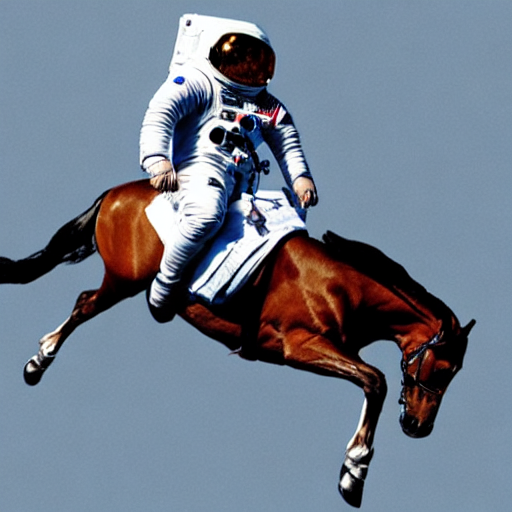

In [9]:
#prompt ="beautyful nude woman body " 
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=50).images[0]

Running the pipeline shows a progress bar with a certain number of steps. This is because Stable Diffusion is based on a progressive denoising algorithm that is able to create a convincing image starting from pure random noise. 
Models in this family are known as _diffusion models_. <br>
Below Here's an example of the process (from random noise at top to progressively improved images towards the bottom) 
of a model drawing handwritten digits, which we'll build from scratch ourselves later in the course.

What it is doing in those 51 steps is: 
starts with random noise and each step it tries to make it slightly less noisy,  
and slightly more like the thing we want. 
Below (left side) is showing all the steps to create the first 4, and on the right side the first 1. 
Looking closely in this noise, there is something that looks a bit like a "1".
This is how these diffusion models, basically, work.

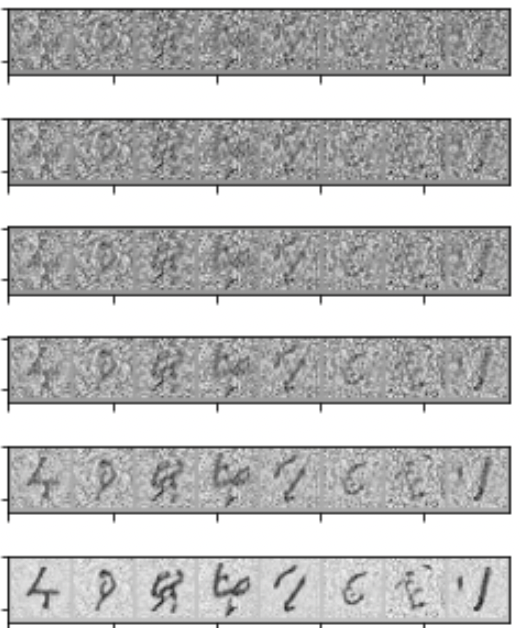

Can we just do it in one go? If we try to do it in one go it doesn't do a good job. 
2022 models aren't smart enough  to do it in one go. 

  0%|          | 0/4 [00:00<?, ?it/s]

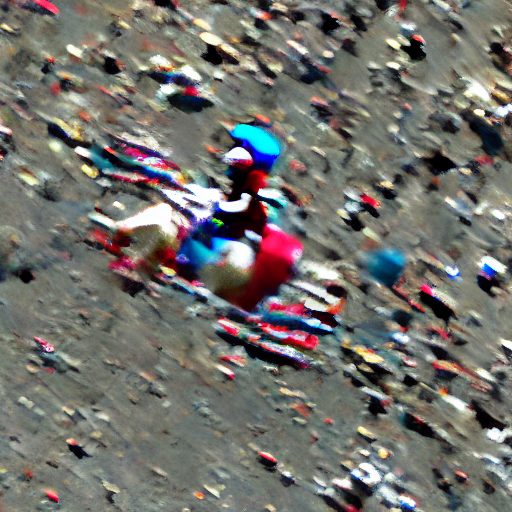

In [10]:
torch.manual_seed(1024)
pipe(prompt, num_inference_steps=3).images[0]

Understanding  this basic concept is important. 
If we do 16 instead of 51 steps is better but not amazing.

  0%|          | 0/17 [00:00<?, ?it/s]

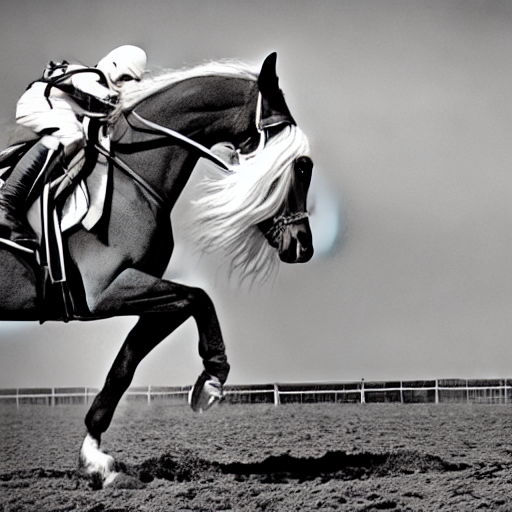

In [11]:
torch.manual_seed(1020)
pipe(prompt, num_inference_steps=16).images[0]

## Guidance

_Classifier-Free Guidance_ is a method to increase the adherence of the output to the conditioning signal we used (the text).

Roughly speaking, the larger the guidance the more the model tries to represent the text prompt. However, large values tend to produce less diversity. The default is `7.5`, which represents a good compromise between variety and fidelity. This [blog post](https://benanne.github.io/2022/05/26/guidance.html) goes into deeper details on how it works.
Guidance scale for every single prompt it's creating two versions: the image with and without the prompt, then it takes the average of both.


We can generate multiple images for the same prompt by simply passing a list of prompts instead of a string.

The `guidance_scale` parameter indicates to what degree to focus on the specific caption versus
just creating an image. 7.5 is the default.
At lower guidance scale generated images don’t look like the prompt, 
at guided scale 7, they look more like it, and at 14 they get a little bit too abstract.

In [12]:
from fastcore.all import concat
torch.manual_seed(1024)
num_rows,num_cols = 4,4
prompts = [prompt] * num_cols  # num_cols times the same prompt
images = concat(pipe(prompts, guidance_scale=g, num_inference_steps=60).images for g in [1, 2.1,3.5,7.5,14])

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

  0%|          | 0/61 [00:00<?, ?it/s]

In [13]:
from PIL import Image
import matplotlib.pyplot as plt

def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

Each row here is at a different “guidance scale”.  
The first row, it hasn't listened, weird looking things. 
At guided scale of 3, they look more like they might be astronautish 
and at 7.5 and above they're certainly.<br>
For every single prompt, it's creating two versions: 
one of the image with the prompt —“an astronaut riding a horse”— and one with no prompt,
then it takes the weighted average, with `guidance_scale` as weight.

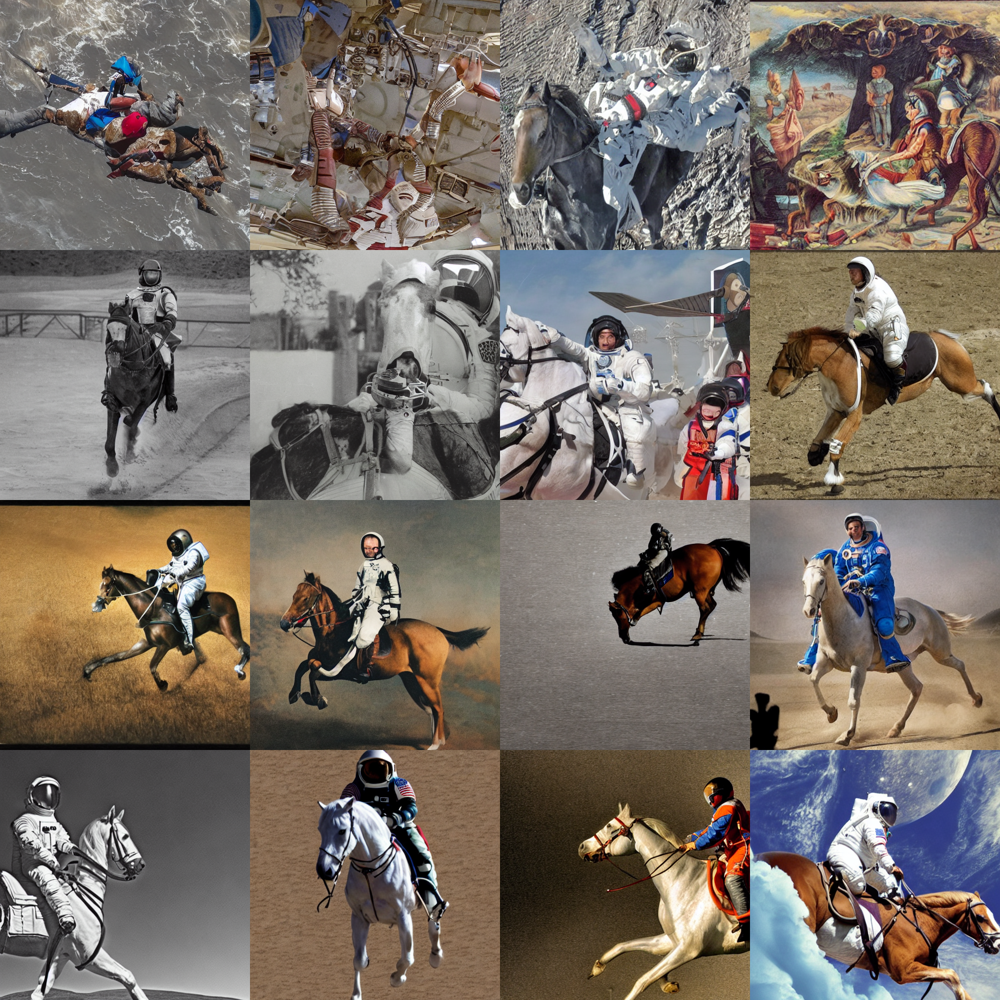

In [14]:
image_grid(images, rows=num_rows, cols=num_cols)

### _Negative prompting_ 
refers to the use of another prompt (instead of a completely unconditioned generation), and scaling the difference between generations of that prompt and the conditioned generation.

In other words, we can also subtract something using a negative prompt to diffusers.

  0%|          | 0/51 [00:00<?, ?it/s]

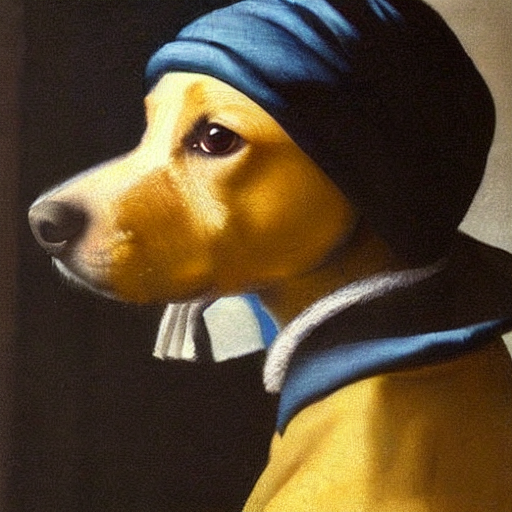

In [15]:
torch.manual_seed(1000)
prompt = "Dog in the style of Vermeer"
pipe(prompt).images[0]

  0%|          | 0/51 [00:00<?, ?it/s]

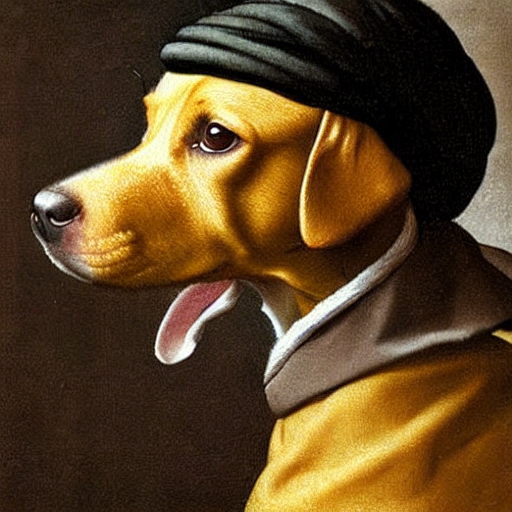

In [16]:
torch.manual_seed(1000)
pipe(prompt, negative_prompt="blue").images[0]

By using the negative prompt we move more towards the direction of the positive prompt, effectively reducing the importance of the negative prompt in our composition.

In [17]:
del(pipe)
torch.cuda.empty_cache()

## Image to Image

We can use the raw image diffusion process for other tasks.
For example, instead of starting from pure noise, we can start from an image an add a certain amount of noise to it. 
We are replacing the initial steps of the denoising and **pretending our image is what the algorithm came up with.** 
Then we continue the diffusion process from that state as usual.

This usually preserves the composition although details may change a lot. It's great for sketches!

These operations (provide an initial image, add some noise to it and run diffusion from there) can be automatically performed by a special image to image pipeline: `StableDiffusionImg2ImgPipeline`. This is the source code for its [`__call__` method](https://github.com/huggingface/diffusers/blob/main/src/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py#L124).

In [18]:
from diffusers import StableDiffusionImg2ImgPipeline

pipei2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4",
    revision="fp16",
    torch_dtype=torch.float16
).to("cuda")

pipei2i.enable_attention_slicing()

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

We'll use as an example the following sketch created by [user VigilanteRogue81](https://huggingface.co/spaces/huggingface-projects/diffuse-the-rest/discussions/204).

We can grab a sketch and pass to the I2I image to image pipeline as the initial image to start with. 
Rather than starting the diffusion process with random noise, it's going to start it with  
a noisy version of the sketch drawing.

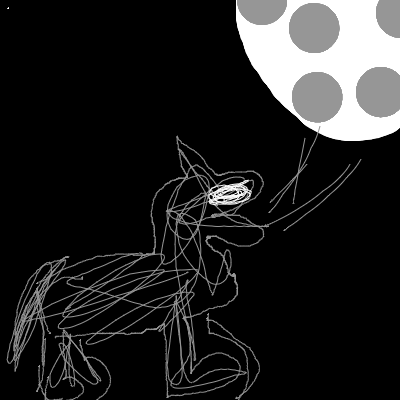

In [19]:
from fastdownload import FastDownload
p = FastDownload().download('https://s3.amazonaws.com/moonup/production/uploads/1664665907257-noauth.png')
init_image = Image.open(p).convert("RGB")
init_image

It's going to try to create something that matches this caption, and also follows 
the sketch as a guiding starting point.  
And so as a result, we get things that look better than the original drawing,  
but with a matching composition.

`strength` is saying to what degree we want to really  create something that looks like this.

When we get a composition we like we can use it as the next seed for another prompt and further change the results. For example, let's take the third image above and try to use it to generate something in the style of Van Gogh.

  0%|          | 0/70 [00:00<?, ?it/s]

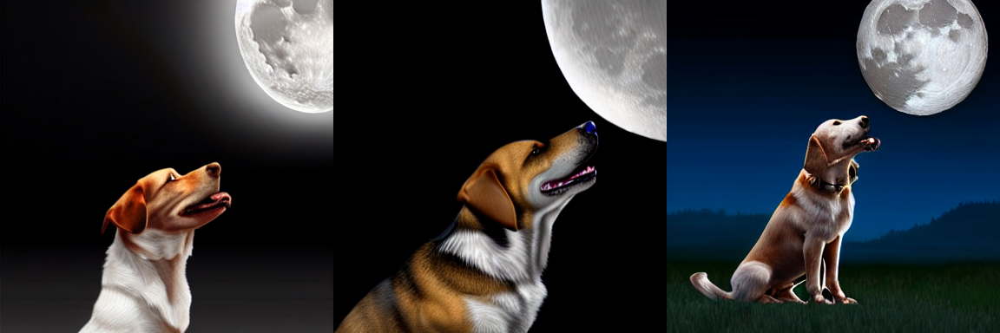

In [20]:
torch.manual_seed(1000)
prompt = "Dog howling at the moon photorealistic 4K"
#prompt = "Oil painting of wolf howling at the moon by Van Gogh"
images = pipei2i(prompt=prompt, num_images_per_prompt=3, init_image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3)

  0%|          | 0/70 [00:00<?, ?it/s]

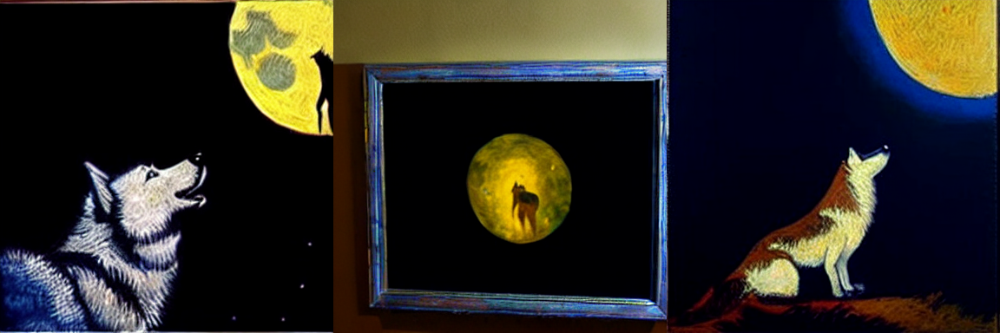

In [21]:
prompt = "Oil painting of wolf howling at the moon by Van Gogh"
images = pipei2i(prompt=prompt, num_images_per_prompt=3, init_image=init_image, strength=1, num_inference_steps=70).images
image_grid(images, rows=1, cols=3)

In [22]:
del(pipei2i)

torch.cuda.empty_cache()

Creative people use different tools in a process of iterative refinement to come up with the ideas they have in mind. Here's a [list with some suggestions](https://github.com/fastai/diffusion-nbs/blob/43a090286e5742f807d4ff58524c02a1888b3004/suggested_tools.md) to get started. 

## Textual inversion 
is a process where you can quickly "teach" a new word to the text model and plain its embeddings close to some visual representation. 
This is achieved by adding a new token to the vocabulary, freezing the weights of all the models (except the text encoder), and train with a few representative images.

This is a schematic representation of the process by the [authors of the paper](https://textual-inversion.github.io).

![Textual Inversion diagram](https://textual-inversion.github.io/static/images/training/training.JPG)

---

In textual inversion we fine-tune just a single embedding.

You can train your own tokens with photos you provide using [this training script](https://github.com/huggingface/diffusers/tree/main/examples/textual_inversion) or [Google Colab notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/sd_textual_inversion_training.ipynb). There's also a [Colab notebook for inference](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_conceptualizer_inference.ipynb), but we'll show below the steps we have to follow to add a trained token to the vocabulary and make it work the pre-trained Stable Diffusion model.

For example, we can create a new embedding for a particular look, say “watercolor portrait”.
Below are steps to follow to add a trained token to the vocabulary and make it work the pre-trained Stable Diffusion model.

We'll try an example using embeddings trained for [this style](https://huggingface.co/sd-concepts-library/indian-watercolor-portraits).

In [23]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16) 
pipe = pipe.to("cuda")

pipe.enable_attention_slicing()

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

In [24]:
#Get the embedding for a new token
embeds_url = "https://huggingface.co/sd-concepts-library/indian-watercolor-portraits/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)

In [25]:
#Get the embedding for a new token sd-concepts-library/cortana
embeds_url2 = "https://huggingface.co/sd-concepts-library/cortana/resolve/main/learned_embeds.bin"
embeds_path2 = FastDownload().download(embeds_url2)

In [26]:
embeds_dict = torch.load(str(embeds_path2), map_location="cpu")

The embeddings for the new token are stored in a small PyTorch pickled dictionary, whose key is the new text token that was trained. Since the encoder of our pipeline does not know about this term, we need to manually append it.

In [27]:
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)
new_token

'<watercolor-portrait>'

We add the new token to the tokenizer and the trained embeddings to the embeddings table.

In [28]:
assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

In [29]:
text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

We can now run inference and refer to the style as if it was another word in the dictionary.

In [30]:
{new_token}

{'<watercolor-portrait>'}

  0%|          | 0/51 [00:00<?, ?it/s]

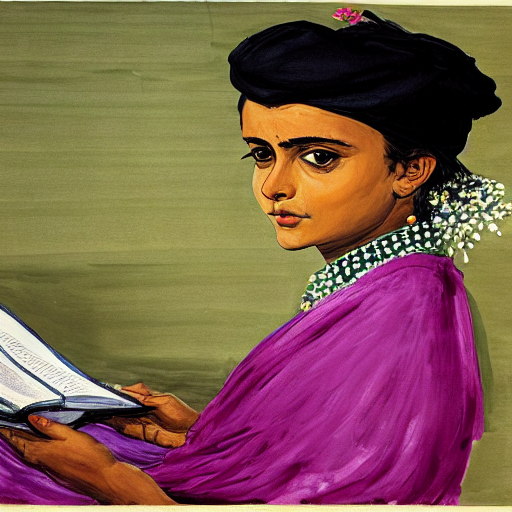

In [31]:
torch.manual_seed(1000)
image = pipe("Girl reading in the style of " + new_token).images[0]
image

  0%|          | 0/51 [00:00<?, ?it/s]

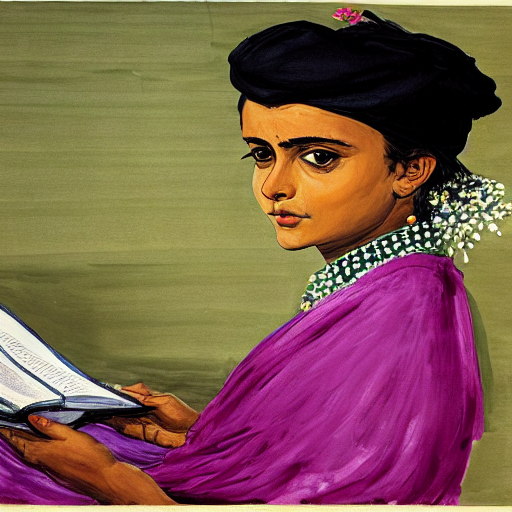

In [32]:
torch.manual_seed(1000)
image = pipe("Girl reading in the style of <watercolor-portrait>").images[0]
image

### Dreambooth

DreamBooth  takes an existing token that isn't used much (e.g., SKS) 
and fine tunes a model to bring that token. 
You can use pictures of someone and fine-tune the token to be images in a particular style.
The  service strmr [Astria](https://www.strmr.com/) is using Dreambooth. 

In [33]:
import torch
from diffusers import StableDiffusionPipeline
pipe = StableDiffusionPipeline.from_pretrained("pcuenq/jh_dreambooth_1000", torch_dtype=torch.float16).to("cuda")

pipe.enable_attention_slicing()

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

In [34]:
torch.manual_seed(1000)

prompt = "Painting of sks person in the style of Renoir"
images = pipe(prompt, num_images_per_prompt=4).images

  0%|          | 0/51 [00:00<?, ?it/s]

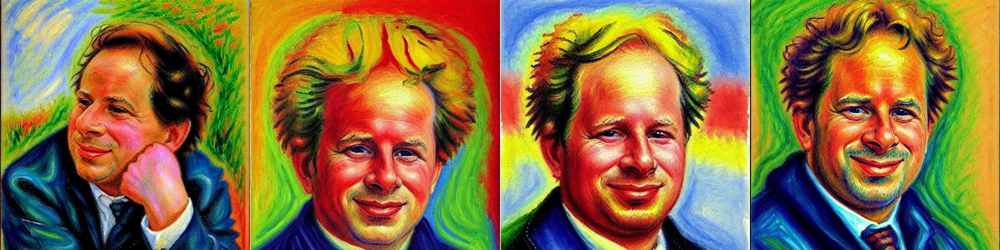

In [35]:
from PIL import Image
image_grid(images, 1, 4)

In [36]:
del(pipe)
torch.cuda.empty_cache()